# End to end dog breed classification

## 1. Problem

Identify the breed of a dog

## 2.Data
 Using data from kaggle

 ## 3.Evaluation

 The evaluation is a file with predictable probablities for each dog breed of each test image.

 ## 4. Features

 * We are dealing with images so it's probably best we use deep learning/transfer learning.
 * There are 120 breeds of dogs
 * There are around 10,000+ images in the test set and training set.

### Getting our workspace ready

In [1]:
# Import TensorFlow 
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF Hub:",hub.__version__)

# Check for GPU
print("GPU","available (YESS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.5.0
TF Hub: 0.12.0
GPU available (YESS!!!)


## Getting data ready



In [2]:
# Checkinga labels
import pandas as pd
labels_csv =pd.read_csv("/content/drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     46c078621fd05d3166b393e0a5104fce  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


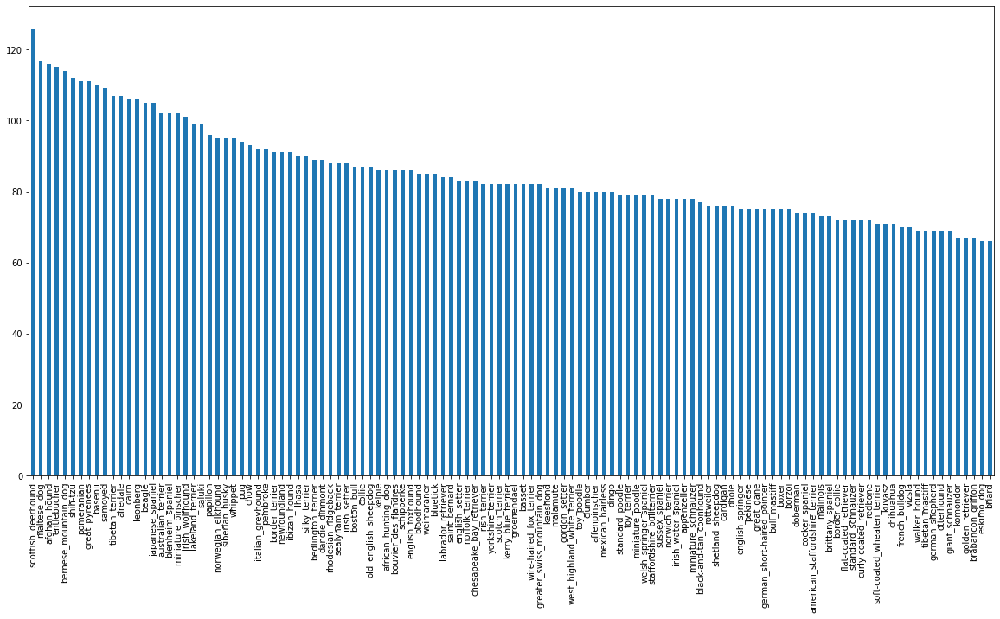

In [4]:
# How many images are there of each breed

labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [5]:
labels_csv["breed"].value_counts().median()

82.0

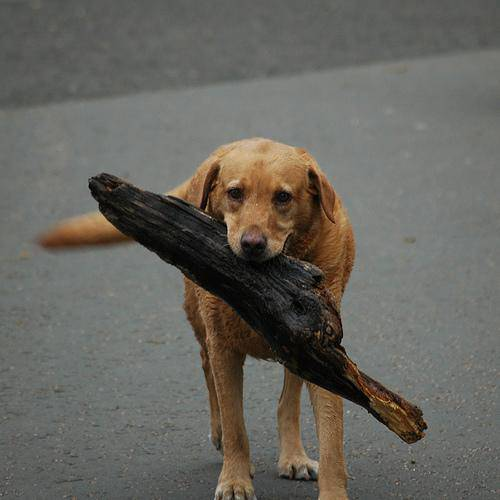

In [6]:
# Let's view an image

from IPython.display import Image
Image("/content/drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Getting images and their labels

let's get a list of all our image file pathnames

In [7]:
filenames = ["/content/drive/MyDrive/Dog vision/train/"+ fname+".jpg" for fname in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether number of filenames matches number of actual image files
import os 
if len(os.listdir("/content/drive/MyDrive/Dog vision/train/"))==len(filenames):
  print("Matched!!")
else:
  print("Not Matched")  

Matched!!


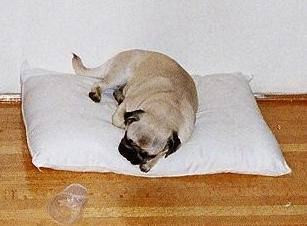

In [9]:
# One more check
Image(filenames[5008])

In [10]:
labels_csv["breed"][5008]

'pug'

Since we've now got our training images filepaths in a list, let's prepare our labels.

In [11]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
#labels = np.array(labels) #does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [13]:
if len(labels) == len(filenames):
  print("Matched")
else:
  print("Not Matched")


Matched


In [14]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
# Turning a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
len(labels)

10222

In [17]:
# Turning every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
# Turing boolean array ito integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:

print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
filenames[:10]

['/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

In [22]:
# Setup X and y variables

X=filenames
y=boolean_labels


In [23]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increased as needed

In [24]:
# Set  number of images to use for experimenting
NUM_IMAGES =1000 #@param{type:"slider",min:1000,max:10000,step:1000}

In [25]:
from sklearn.model_selection import train_test_split

np.random.seed(42)

# Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                 random_state= 42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [26]:
# Let's have a geez at the training data
X_train[:5],y_train[:2]

(['/content/drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing images(Turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to variable
3. turn our image into Tensors
4. Resize the image to be a shape of (224,224)
5. Return the modified image

In [27]:
# Convert image into numpy array
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
image.max(),image.min()

(255, 0)

In [29]:
#Turning image into tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

In [30]:
# Defining image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path,img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-225 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value(224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


## Turning our data into batches

Let's say you're trying to process 10,000+ images in one go .. they all might not fit into memory.

So that's why we do about 32 images at a time.

In order to use our TensorFlow effectively, we need our data in the form of Tensor tuples.

In [31]:
# Create a simple function to return a tuple(image,label)
def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

In [32]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [33]:
# Defining batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):

  # If the data is the test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # IF the data is a valid data set , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches..")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  
                                               tf.constant(y))) 
    # Shuffling pathnames and labels before mapping image process function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image,label) tuples 
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch 



In [34]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches..
Creating validation data batches..


In [35]:
# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [36]:
# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  plt.figure(figsize=(10,10))
  # Loop through 25 
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title 
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

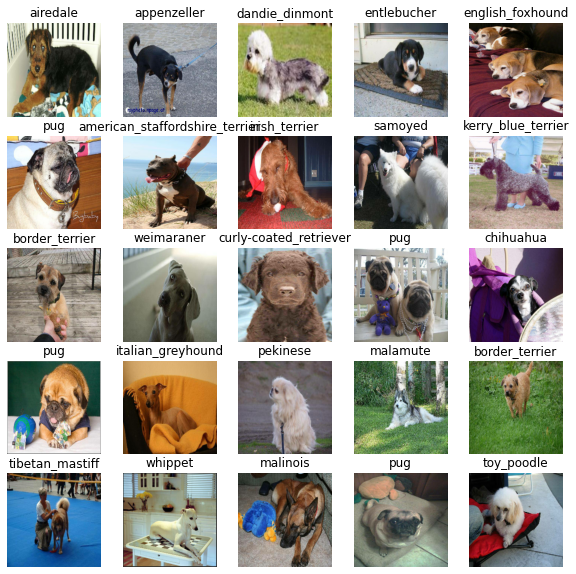

In [37]:
# Visualizing the data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

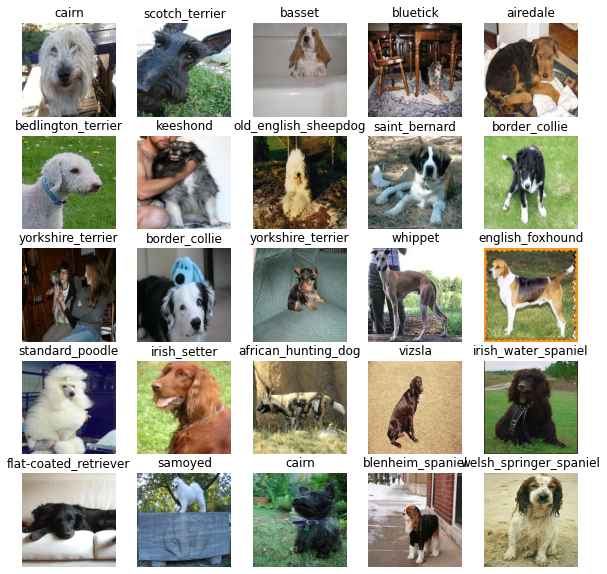

In [38]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape to our model.
* The output shape of our model.
* The URL of the model we want to use.

In [39]:
# Setup input shape to the model
INPUT_SHAPE =[None,IMG_SIZE,IMG_SIZE,3] # batch,height,width,color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow HUb
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs, outputs and model ready to go.
Let's put them together into a keras deep learning model.

Create a function:

* Take input,output and model we've choosen as parameters.
* Defines the layers in a Keras model in sequential fashion(.
* Complies the model(says it should be evaluated and improved)
* Builds thr model
* Returns the model

In [40]:
# Create a function which builds keral model
def create_model(input_shape=INPUT_SHAPE,output_shape =OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with|:",MODEL_URL)

  # Setup the model layers
  model =tf.keras.Sequential([hub.KerasLayer(MODEL_URL), #Input layer
                              tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                    activation="softmax") # output layer
                              ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"])
  
  # Build a model
  model.build(INPUT_SHAPE)

  return model

In [41]:
model = create_model()
model.summary()

Building model with|: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

callbacks are helper functions a model can use during trainig to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create teo callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function



In [42]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [43]:

import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)


### Early stopping callback

In [44]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model 

Our first model is only going to train on 1000 images , to make sure its working

In [45]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [46]:
# Checking to make sure we are working on GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not avialable")

GPU available


Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data,validation data,number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [47]:
# Build a function to train and return a trained model
def train_model():
  # Create a model
  model = create_model()

  # Create a new tensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing 
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  # Return the fitted model
  return model


In [48]:
# Fit the model to the data
model = train_model()

Building model with|: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 120s 4s/step - loss: 4.6226 - accuracy: 0.0950 - val_loss: 3.4374 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 3s 126ms/step - loss: 1.6455 - accuracy: 0.6825 - val_loss: 2.2639 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 3s 128ms/step - loss: 0.5754 - accuracy: 0.9475 - val_loss: 1.7323 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 3s 125ms/step - loss: 0.2526 - accuracy: 0.9900 - val_loss: 1.5491 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 127ms/step - loss: 0.1473 - accuracy: 0.9950 - val_loss: 1.4737 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 127ms/step - loss: 0.1017 - accuracy: 0.9987 - val_loss: 1.4221 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs

The tensorboard magic function will acess the logs directory we created earlier and visualize its contents.

In [49]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model.

In [50]:
# Make prediction on validation data 
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 83ms/step


array([[1.4224862e-03, 2.3825717e-04, 9.1024314e-04, ..., 3.3430694e-04,
        2.6551486e-05, 4.7850894e-04],
       [5.4381922e-04, 5.5203505e-04, 8.9659654e-03, ..., 6.9123163e-04,
        1.8062664e-03, 8.1095888e-05],
       [2.3857876e-05, 8.4784642e-06, 4.7473004e-06, ..., 7.4280288e-06,
        1.7115050e-05, 9.3537332e-05],
       ...,
       [1.2565541e-06, 1.8508103e-05, 1.1461483e-05, ..., 4.8786151e-06,
        2.0221152e-04, 1.0945863e-04],
       [3.6962698e-03, 2.2502267e-04, 2.0851771e-04, ..., 1.5013384e-04,
        5.3573236e-05, 2.1713650e-02],
       [1.9540121e-03, 7.5242482e-05, 3.1574044e-04, ..., 1.2662404e-03,
        9.9656382e-04, 1.9163644e-04]], dtype=float32)

In [51]:
predictions.shape

(200, 120)

In [52]:
 # First prediction
 index=0
 print(predictions[0])
 print(f"Max value (probability of prediction): {np.max(predictions[index])}")
 print(f"Max index:{np.argmax(predictions[index])}")
 print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.42248615e-03 2.38257169e-04 9.10243136e-04 1.47368628e-05
 4.10911947e-04 9.39067904e-05 7.81242847e-02 3.38475162e-04
 1.32990725e-04 1.23087503e-03 1.25961681e-03 5.76101738e-05
 3.35477613e-04 5.49106007e-05 2.46969896e-04 9.91844456e-04
 6.06815083e-05 2.19983175e-01 5.80521009e-05 4.13444686e-05
 1.99619401e-03 1.00602694e-04 7.92708888e-05 6.43088575e-03
 1.81905179e-05 1.33071168e-04 7.76034668e-02 1.68454993e-04
 1.98314409e-03 2.73460726e-04 4.34905451e-05 8.60100030e-04
 5.25719777e-04 3.52179013e-05 8.76410122e-05 6.82456419e-02
 2.24547530e-05 4.67881910e-04 3.74860792e-05 2.81480723e-04
 7.43063341e-04 5.44557442e-05 7.34324130e-05 1.62206881e-04
 7.41528929e-05 2.65970302e-04 2.23149673e-05 1.74655710e-04
 1.65936199e-03 9.19997576e-04 2.66554212e-04 5.15804386e-05
 1.46698393e-03 8.80357675e-06 6.15453609e-05 5.00899732e-05
 2.82272755e-04 1.56166684e-03 3.91281297e-04 7.13651627e-02
 5.15177380e-04 1.66146972e-04 2.72596674e-03 2.55404029e-05
 5.86302951e-04 5.910389

In [53]:
# Turn function probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction into a label
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probablities
pred_label = get_pred_label(predictions[81])
pred_label  


'dhole'

Now since our data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation label(truth labels).

In [54]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  images =[]
  labels=[]
  #Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels  

# Unbatchify
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [55]:
images_ =[]
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

  images_[0],labels_[0]

In [56]:
get_pred_label(labels_[0])

'cairn'

Now we've ways to get :
* prediction labels
* Validation labels
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which: 
* Takes an array of prediction probabilities,truth labels and array of images and integers.
* Convert the prediction probabilities to a predcited label.
* Plot the predicted label,truth label and the taregt image on a single plot.

In [57]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Chaneg the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color="red"  

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:0.2f}% {}".format(pred_label,
                                 np.max(pred_prob)*100,
                                 true_label),
            color=color)

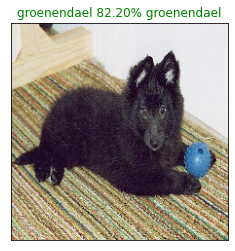

In [58]:
plot_pred(prediction_probabilities=predictions,
          labels= val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top predictions, lets make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probablities array and a ground truth array and an integer.
* find the prediction using get_pred_label()
* Find the top 10:
1. Prediction probablities indexes
2. Prediction probabalities values
3. prediction labels

* Plot the top 10 prediction probablity values and labels, coloring the true label green.

In [59]:
def plot_pred_conf(prediction_probabilities, labels,n=1):
  pred_prob,true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence index
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation ="vertical")
  
  # Change color
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass  

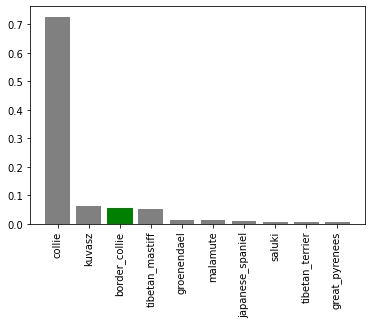

In [60]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model

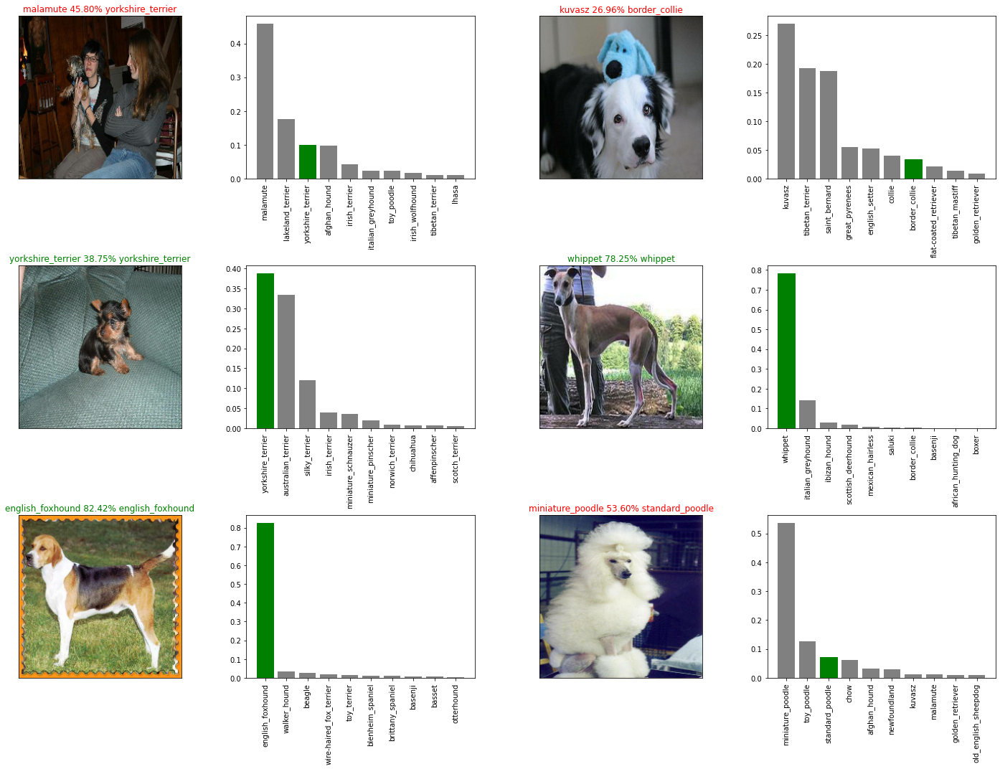

In [61]:
# Lets check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols =2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)  
plt.show()

## Saving and reloading a trained model

In [62]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model directory and appends a suffix
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix + ".h5"
  print(f"Saving model to : {model_path}..")
  model.save(model_path)
  return model_path

In [63]:
# Create a  function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


Now we've got functions to save and load a trained model, lets make sure they work!

In [64]:
# Save our model trained on 100 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : /content/drive/MyDrive/Dog vision/models/20210724-13261627133217_1000-images-mobilenetv2-Adam.h5..


'/content/drive/MyDrive/Dog vision/models/20210724-13261627133217_1000-images-mobilenetv2-Adam.h5'

In [65]:
# Load a trained model 
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog vision/models/20210723-09591627034359_1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog vision/models/20210723-09591627034359_1000-images-mobilenetv2-Adam.h5


In [66]:
# Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2873 - accuracy: 0.7000


[1.2873191833496094, 0.699999988079071]

In [67]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 116ms/step - loss: 1.3595 - accuracy: 0.6450


[1.3595080375671387, 0.6449999809265137]

## Training a model on the full data

In [68]:
len(X), len(y)

(10222, 10222)

In [69]:
# Create a data batch with a full dataset
full_data = create_data_batches(X,y)


Creating training data batches..


In [70]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [71]:
# Create a model for full model
full_model = create_model()

Building model with|: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [72]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data , so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [73]:
# Fit the full model to the full datat
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1064s 3s/step - loss: 1.3315 - accuracy: 0.6734
Epoch 2/100
320/320 [==============================] - 30s 95ms/step - loss: 0.3953 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 31s 98ms/step - loss: 0.2360 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 31s 96ms/step - loss: 0.1511 - accuracy: 0.9641
Epoch 5/100
320/320 [==============================] - 32s 100ms/step - loss: 0.1067 - accuracy: 0.9766
Epoch 6/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0754 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0574 - accuracy: 0.9927
Epoch 8/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0455 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0359 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 32s 98ms/step

In [74]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to : /content/drive/MyDrive/Dog vision/models/20210724-13561627134981_full-image-set-mobilenetv2-Adam.h5..


'/content/drive/MyDrive/Dog vision/models/20210724-13561627134981_full-image-set-mobilenetv2-Adam.h5'

In [75]:
# Loading the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog vision/models/20210723-12471627044475_full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog vision/models/20210723-12471627044475_full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on the test data,we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and cover them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames inot test data batches using create_data_batches() and setting the test_data parameter to True(since the test data doesn't have labels)
* Make a prediction array by passing the test batches to the predict() method called on our model.

In [76]:
# Load test image filenames
test_path ="/content/drive/MyDrive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog vision/test/dfefaa03faeab447d6b48e7367255b43.jpg',
 '/content/drive/MyDrive/Dog vision/test/e1fa4eb8a57184773ac11efe0de11e92.jpg',
 '/content/drive/MyDrive/Dog vision/test/e1cfddc1d5315f1dba011c6152822786.jpg',
 '/content/drive/MyDrive/Dog vision/test/e596c0d97b381e876d46dda2eb60074c.jpg',
 '/content/drive/MyDrive/Dog vision/test/dd0366f494e4e65780e91d2abf16f4bf.jpg',
 '/content/drive/MyDrive/Dog vision/test/e00a1b26edd5cb7323e3b75ce37b36f6.jpg',
 '/content/drive/MyDrive/Dog vision/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 '/content/drive/MyDrive/Dog vision/test/e2ef94a22af1d5375132de4eb19d2a64.jpg',
 '/content/drive/MyDrive/Dog vision/test/df4b040b13c5f514d215ba7c0813eaf8.jpg',
 '/content/drive/MyDrive/Dog vision/test/e6295bd4afe5ddf93a02cbd668819e9e.jpg']

In [77]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches..


In [78]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [79]:
# Make predictions on test data batch using loaded_full_model
test_predictions = loaded_full_model.predict(test_data,verbose=1) 

324/324 [==============================] - 1169s 4s/step


In [80]:
# Save predictions to csv file
np.savetxt("/content/drive/MyDrive/Dog vision/preds_array.csv",test_predictions,delimiter=",")

In [81]:
# Load predictions from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog vision/preds_array.csv",delimiter=",")

In [82]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

To get the data in kaggle required format we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data to each of the dog breed columns.
* Export the DataFrame as a csv to submit it to Kaggle.

In [83]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [95]:
# Append test image ID's to predicton DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [96]:
# Add the prediciton probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions


In [97]:
preds_df.to_csv("/content/drive/MyDrive/Dog vision/submission_1_mobilenetv2.csv",
                index= False)